# Local Image Descriptor

## 2.1 Harris Corner Detection
$$
    \mathbf{M}_I=\nabla \mathbf{I} \nabla \mathbf{I}^T
    =\left[
        \begin{array}{c}
        \mathbf{I}_x\\
        \mathbf{I}_y
        \end{array}
    \right]
    \left[
        \begin{array}{c}
        \mathbf{I}_x^T&
        \mathbf{I}_y^T
        \end{array}
    \right]
    =
    \left[
        \begin{array}{c}
        \mathbf{I}_x\mathbf{I}_x^T &  \mathbf{I}_x \mathbf{I}_y^T\\
        \mathbf{I}_y \mathbf{I}_x^T & \mathbf{I}_y\mathbf{I}_y^T \\
        \end{array}
    \right]
$$

Consider a center point $(x,y)$ in the grayscale image $\mathbf{I}$,
taking an image patch over $(x,y)$ and shifting it by $(\Delta x, \Delta y)$.
Define a function $f: \mathbb{R}^{d_1\times d_2} \rightarrow \mathbb{R} $ to measure the difference(or variation) between the two patches:
$$
f(x,y)=\sum_{(x_k,y_k)\in W} (\mathbf{I}(x_k,x_y)-\mathbf{I}(x_k+\Delta x,y_k + \Delta y) )^2, 
$$

where $W$ denotes a windows whose center is $(x,y)$, thus $d_1$ and $d_2$ is the size of window.

Use multi-variant taylor expansion, we have:
$$\mathbf{I}(x_k+\Delta x,y_k + \Delta y) \approx\mathbf{I}(x_k,y_k)+\mathbf{I}_x(x_k,y_k)*\Delta x + \mathbf{I}_y(x_k,y_k)*\Delta y,$$

where $\mathbf{I}_x$ and $\mathbf{I}_y$ means the derivate of image $\mathbf{I}$ with respect to $x$ and $y$, respectively.

Now we can obtain:
$$f(x,y)\approx\sum_{(x_k,y_k)\in W}( \mathbf{I}_x(x_k,y_k)*\Delta x +\mathbf{I}_y(x_k,y_k)*\Delta y)^2.$$

Arrange the above equation, we have:
$$
\begin{aligned}
    f(x,y)
    &\approx \sum_{(x_k,y_k)\in W}
    \left[
        \begin{array}{c}
            \Delta x &
            \Delta y
        \end{array}
    \right]
    \left[
        \begin{array}{c}
            \mathbf{I}_x(x_k,y_k) \mathbf{I}_x(x_k,y_k) & \mathbf{I}_x(x_k,y_k)\mathbf{I}_y(x_k,y_k) \\
            \mathbf{I}_y(x_k,y_k) \mathbf{I}_x(x_k,y_k) & \mathbf{I}_y(x_k,y_k)\mathbf{I}_y(x_k,y_k) \\
        \end{array}
    \right]
    \left[
        \begin{array}{c}
            \Delta x\\
            \Delta y
        \end{array}
    \right]
    \\
    &=
    \left[
        \begin{array}{c}
            \Delta x &
            \Delta y
        \end{array}
    \right]
    \mathbf{M}
    \left[
        \begin{array}{c}
            \Delta x\\
            \Delta y
        \end{array}
    \right]
\end{aligned}
$$

where matrix $\mathbf{M}$ satisfies:
$$
\mathbf{M}=
    \left[
        \begin{array}{c}
            \sum_{(x_k,y_k) \in W} \mathbf{I}_x(x_k,y_k) \mathbf{I}_x(x_k,y_k) 
             & \sum_{(x_k,y_k) \in W} \mathbf{I}_x(x_k,y_k) \mathbf{I}_y(x_k,y_k)
             \\
            \sum_{(x_k,y_k) \in W} \mathbf{I}_y(x_k,y_k) \mathbf{I}_x(x_k,y_k)
            &\sum_{(x_k,y_k) \in W} \mathbf{I}_y(x_k,y_k) \mathbf{I}_y(x_k,y_k)
        \end{array}
    \right]
$$

We can apply convolution to the derivative's multiplication to get the matrix $\mathbf{M}$ on each pair $(x,y)$.

They defined the Harris response:
$$
rps=\frac{\det(\mathbf{M})}{\text{tr}(\mathbf{M})}
$$

Besides, $\det{M}=\lambda_1\lambda_2$ and $\text{tr}(\mathbf{M})=\lambda_1+\lambda_2$, $\lambda_1$ and $\lambda_2$ is the
eigenvalue of matrix $\mathbf{M}$ respectively.


if $\lambda_1\gg \lambda_2 \approx 0 $, means there is an edge,

if $\lambda_1 \approx \lambda_2 \gg 0 $, means there is a corner.

if $\lambda_1 \approx \lambda_2 \approx 0$, means there is the empty.

When $rps\approx 0$, means there is not a corner, thus we can use a threshold to otain the potentially corner-like position.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import filters
from PIL import Image

In [194]:
# implement of the harris...
def get_harris_response(gray_im,sigma=3):
    """
    Get the harris response matrix
    Args:
        gray_im (np.ndarray(uint8)[h,w]): gray image
        sigma (float): sigma for the gaussian filter
    Return:
        harris_response (np.ndarray(float)[h,w]): each entry contains the corresponding respon in `(x,y)`
    """
    # 1. use gaussin_filter to get the derivative
    imdx=np.zeros(gray_im.shape)
    imdy=imdx.copy()
    filters.gaussian_filter(gray_im,(sigma,sigma),(0,1),imdx)
    filters.gaussian_filter(gray_im,(sigma,sigma),(1,0),imdy)

    # 2. convolution, note that it uses gauusian filter...
    ixx=filters.gaussian_filter(imdx*imdx,(sigma,sigma))
    ixy=filters.gaussian_filter(imdx*imdy,(sigma,sigma))
    iyy=filters.gaussian_filter(imdy*imdy,(sigma,sigma))    
    
    # 3. get response
    det_m=ixx*iyy-ixy**2
    trace_m=ixx+iyy
    harris_response=det_m/trace_m
    return np.nan_to_num(harris_response)


In [193]:
def get_harris_corner(hrs_rps,min_dis=10,threshold=.1):
    """
    Get harris corner from the harris matrix
    Args:
        hrs_rps (np.ndarray(float)[h,w])
        min_dis (float): minimum distance between two response points
        threshold (float): ratio to remove the response points.
    Return:
        corners (list[(x1,y1),...]): detection points
    """
    # 1. get the real value threshold
    conf=hrs_rps.max()*threshold
    cand_i,cand_j=(hrs_rps>conf).nonzero()
    candidates=np.concatenate([cand_i[:,None],cand_j[:,None]],axis=1) # [n,2]
    assert candidates[:,0].max()<hrs_rps.shape[0] and candidates[:,1].max()<hrs_rps.shape[1]
    # 2. non maximum suppresion...
    cand_scores=hrs_rps[cand_i,cand_j]
    arg_idx=cand_scores.argsort()[::-1]
    
    # sort_cand=candidates[arg_idx]
    # res=[]
    
    keep=[]
    while len(arg_idx)>=2:
        i=arg_idx[0]
        keep.append(i)
        idx_rest=arg_idx[1:]
        p1=candidates[i]
        p2=candidates[idx_rest]
        dist=np.sqrt(((p1[None]-p2)**2).sum(axis=1))
        arg_idx=arg_idx[1:][dist>min_dis]
        
    corners=candidates[keep]
    # change coordinate
    corners=corners[:,::-1]
    return corners

In [5]:
im=np.array(Image.open('../data/empire.jpg').convert('L'))

In [8]:
hrs_mat=get_harris_response(im) 
corners1=get_harris_corner(hrs_mat,6,.01)
corners2=get_harris_corner(hrs_mat,6,.05)
corners3=get_harris_corner(hrs_mat,6,.1)

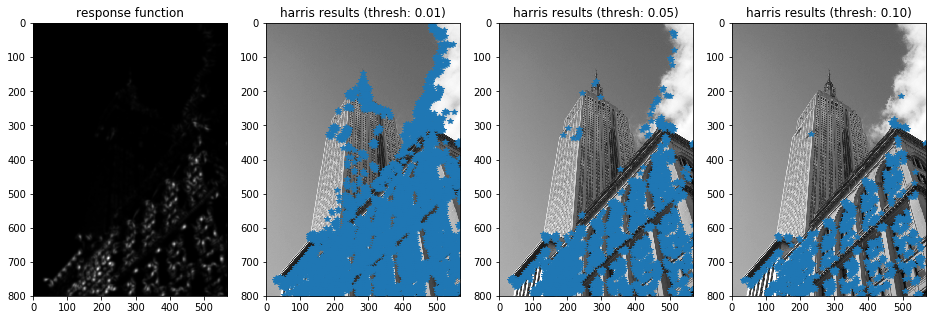

In [9]:
# show
plot_list=[.01,.05,.1]
plt.figure(figsize=(16,16))
plot_col=1+len(plot_list)
plt.subplot(1,plot_col,1)
plt.title('response function')
plt.imshow(hrs_mat,cmap=plt.cm.gray)

for i,(v,corners) in enumerate(zip(plot_list,[corners1,corners2,corners3]) ):
    plt.subplot(1,plot_col,2+i)
    plt.title('harris results (thresh: %.2f)'%(v))
    plt.imshow(im,cmap=plt.cm.gray)
    plt.plot(corners[:,0],corners[:,1],'*')
plt.show()

### Harris Matching

Use the cosine similarities to measure the distance between two image patch $\mathbf{I}_1 \in \mathbb{R}^{(d_1d_2)\times 1} $ and $\mathbf{I}_2 \in \mathbb{R}^{(d_1d_2)\times 1}$:
$$\text{sim}(\mathbf{I}_1,\mathbf{I}_2)=\mathbf{I}_1^T\mathbf{I}_2,$$

Now we normalize it for the stability:
$$\text{ncc}=\frac{(\mathbf{I}_1^T-\mu_1)(\mathbf{I}_2-\mu_2)}{(d_1d_2-1)\sigma_1\sigma_2} ,$$

where $d_1$ and $d_2$ denote the patch size, $\mu_1$ and $\mu_2$ represent the mean value of $\mathbf{I}_1$ and $\mathbf{I}_2$, 
$\sigma_1$ and $\sigma_2$ is variation of $\mathbf{I}_1$ and $\mathbf{I}_2$ respectively.

In [190]:
def get_image_patch(img,coords,width):
    """
    Get patches from coords:
    Args:
        img (np.ndarray(uint8)[h,w,c] or [h,w])
        coords (np.ndarray(int)[n,2])
        width (int)
    Return:
        patches (np.ndarray(uint8)[n,(2*width+1)*(2*width+1)*c] or [n*(2*width+1)*(2*width+1)])
    """
#     for x,y in coords:
    if img.ndim==2:
        h,w=img.shape
        img_pad=np.zeros((h+2*width,w+2*width))
    elif img.ndim==3:
        h,w,c=img.shape
        img_pad=np.zeros((h+2*width,w+2*width,c))
    
#     print(img_pad[width:h+width,width:w+width].shape)
    img_pad[width:h+width,width:w+width]=img
    n=len(coords)
    x,y=np.meshgrid(range(2*width+1),range(2*width+1)) # [d1,d2]
    coords=np.array(coords) # [n,2], 'xy'
#     x=np.tile(x[None],(n,1,1)) # [n,d1,d2]
#     y=np.tile(y[None],(n,1,1)) # [n,d1,d2]
    x=x[None]+coords[:,0][:,None,None]
    y=y[None]+coords[:,1][:,None,None]
    
    patches=img_pad[y,x].reshape(n,-1) # [n,d1,d2,c] or [n,d1,d2]
    return patches

In [191]:
def sim_match(patch1,patch2,threshold=.5):
    """
    Match the best similar patch by ncc.
    Args:
        patch1 (np.ndarray(uint8)[n1,d])
        patch2 (np.ndarray(uint8)[n2,d])
        threshold (float): threshold for similarity.
    Return:
        idx (np.ndarray(float)[n1])
    """
    n1,d=patch1.shape
    n2,d=patch2.shape
    mean1,sigma1=patch1.mean(axis=1),patch1.std(axis=1) # [n1]
    mean2,sigma2=patch2.mean(axis=1),patch2.std(axis=1) # [n2]
#     patch1=np.tile(patch1[:,None],(1,n2,1)) # [n1,n2,d]
#     patch2=np.tile(patch2[None],(n1,1,1)) # [n1,n2,d]
#     sim_mat=( ((patch1[:,None]-mean1[:,None,None])/sigma1[:,None,None]) \
#              * (patch2[None]-mean2[None,:,None])/sigma2[None,:,None] ).sum(axis=2) # [n1,n2]
    sim_mat=((patch1-mean1[:,None])/sigma1[:,None]/(d-1))@( (patch2-mean2[:,None])/sigma2[:,None]).T
    sim_mat[sim_mat<threshold]=0. # is neccessary?
    idx=sim_mat.argmax(axis=1) # [n1]
    
    return idx

In [192]:
def harris_match(im1,im2,width=5,max_dis=None):
    """
    Use harris corner descriptor to match
    Args:
        im1 (np.ndarray(uint8): [h,w,c] or [h,w]): the first input image.
        im2 (np.ndarray(uint8): [h,w,c] or [h,w]): the second input image.
        width (int): the window size.
        max_dis (int): maximum distance between two matched points.  
    Return:
        match_point (list[(x1,y1,x2,y2),...]): the match points' coordinates.
    """
    # 1. get harris corner for individul images
    rsp1=get_harris_response(im1,5)
    corner1 =get_harris_corner(rsp1,width+1)
    rsp2=get_harris_response(im2,5)
    corner2 =get_harris_corner(rsp2,width+1)
    
    # 2. get patches for the corners
    patches1=get_image_patch(im1,corner1,width) # [n1,2]
    patches2=get_image_patch(im2,corner2,width) # [n2,2]
    
    # 3. match with two sides
    idx1=sim_match(patches1,patches2) # [n1]
    idx2=sim_match(patches2,patches1) # [n2]
    
    # [n2], map index1 to n2
    map_idx1=np.full((len(idx2)),-1) 
    map_idx1[idx1]=range(len(idx1))
    
    same_mask=(map_idx1==idx2) # [n2]
    remain_p2=corner2[same_mask] # [n',2]
    remain_p1=corner1[idx2[same_mask]] # [n',2]
    
    match_point =np.concatenate([remain_p1,remain_p2],axis=1) # [n',4]
    if max_dis is not None:
        points_dis=np.linalg.norm(match_point[:,:2]-match_point[:,2:] ,axis=1)
        match_point=match_point[points_dis<max_dis]
    return match_point

In [13]:
im1=np.array(Image.open('../data/crans_1_small.jpg').convert('L'))
im2=np.array(Image.open('../data/crans_2_small.jpg').convert('L'))

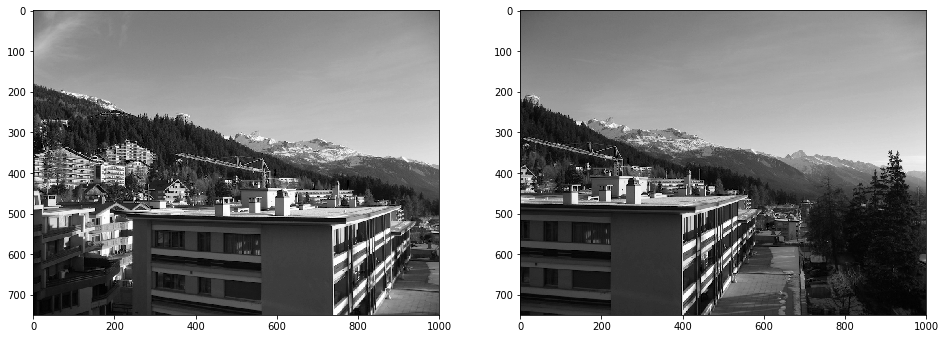

In [14]:
plt.figure(figsize=(16,16))
plt.subplot(1,2,1)
plt.imshow(im1,cmap=plt.cm.gray)
plt.subplot(1,2,2)
plt.imshow(im2,cmap=plt.cm.gray)
plt.show()

In [15]:
match_point=harris_match(im1,im2)

In [16]:
match_point.shape

(313, 4)

In [17]:
comb_img=np.concatenate([im1,im2],axis=1) # [h,w+2]

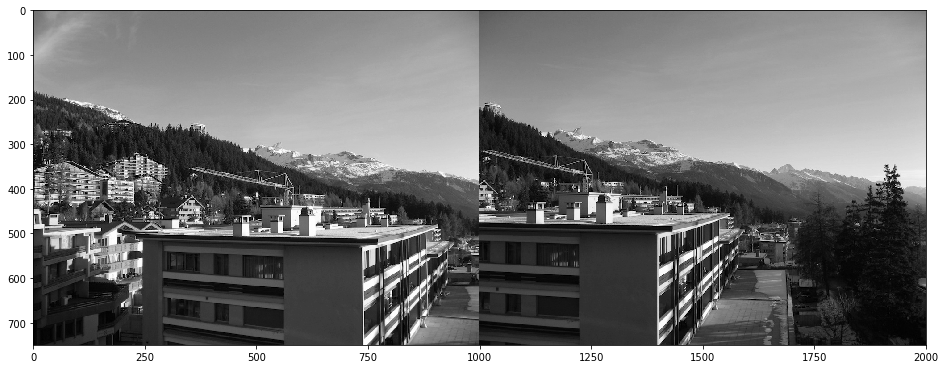

In [18]:
plt.figure(figsize=(16,16))
plt.imshow(comb_img,cmap=plt.cm.gray)
plt.show()

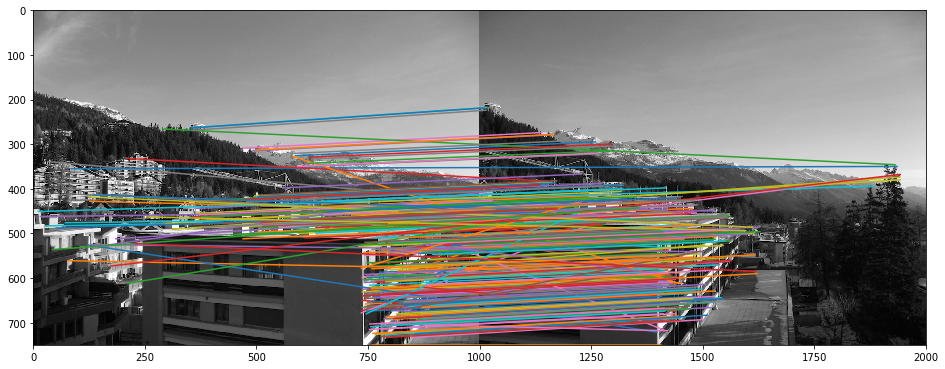

In [19]:
# plot the matching points...
plt.figure(figsize=(16,16))
h,w=im1.shape
plt.imshow(comb_img,cmap=plt.cm.gray)
start=0
window=1000
for x1,y1,x2,y2 in match_point[start:start+window]:
    plt.plot([x1,x2+w],[y1,y2])
plt.show()

## 2.2 SIFT

SIFT uses Difference of Gaussian (DoG):
$$D(\mathbf{x},\sigma)=[G_{k\sigma}(\mathbf{x})-G_{\sigma}(\mathbf{x})]*\mathbf{I}(\mathbf{x})=\mathbf{I}_{k\sigma}-\mathbf{I}_{\sigma}$$

to get the interest points. 

In [104]:
import cv2

In [105]:
def sift_match_once(desp1,desp2):
    """
    Match the best similar points from desp2.
    Args:
        desp1 (np.ndarray(float)[n1,128])
        desp2 (np.ndarray(float)[n2,128])
    Return:
        idx (np.ndarray(int)[n1])
    """
    # 1. normalize to unit vector
    f1=desp1/(np.linalg.norm(desp1,axis=1)[:,None])
    f2=desp2/(np.linalg.norm(desp2,axis=1)[:,None])
    
    cos_sim=f1@f2.T
    ang_dis=np.arccos(cos_sim)
    ang_idx=ang_dis.argsort()
    
    # 2. use ratio ssd to alleviate the ambiguous pair points
    dis_ratio=.6
    i1,i2=ang_dis[range(len(ang_dis)),ang_idx[:,0]],ang_dis[range(len(ang_dis)),ang_idx[:,1]]
    dis_mask=i1< i2*dis_ratio
    idx=np.full(dis_mask.shape,-1)
    idx[dis_mask]=ang_idx[:,0][dis_mask]
    
    return idx

In [106]:
def sift_match(p1,p2,desp1,desp2):
    """
    Two side SIFT match.
    Args:
        p1 (np.ndarray(float)[n1,2])
        p2 (np.ndarray(float)[n2,2])
        desp1 (np.ndarray(float)[n1,128])
        desp2 (np.ndarray(float)[n2,128])
    Return:
        match_point(np.ndarray(int)[n',4]): format is `x1y1x2y2`
    """
    idx1=sift_match_once(desp1,desp2) # [n1]
    idx2=sift_match_once(desp2,desp1) # [n2]
    
    map_idx1=np.full((len(idx2)+1),-2)
    map_idx1[idx1]=range(len(idx1))
    map_idx1=map_idx1[:len(map_idx1)-1]
    same_mask=map_idx1==idx2
    
#     print(same_mask)
    re_p2=p2[same_mask] # [n',2]
    re_p1=p1[idx2[same_mask]]
    
    return np.concatenate([re_p1,re_p2],axis=1) # [n',4]

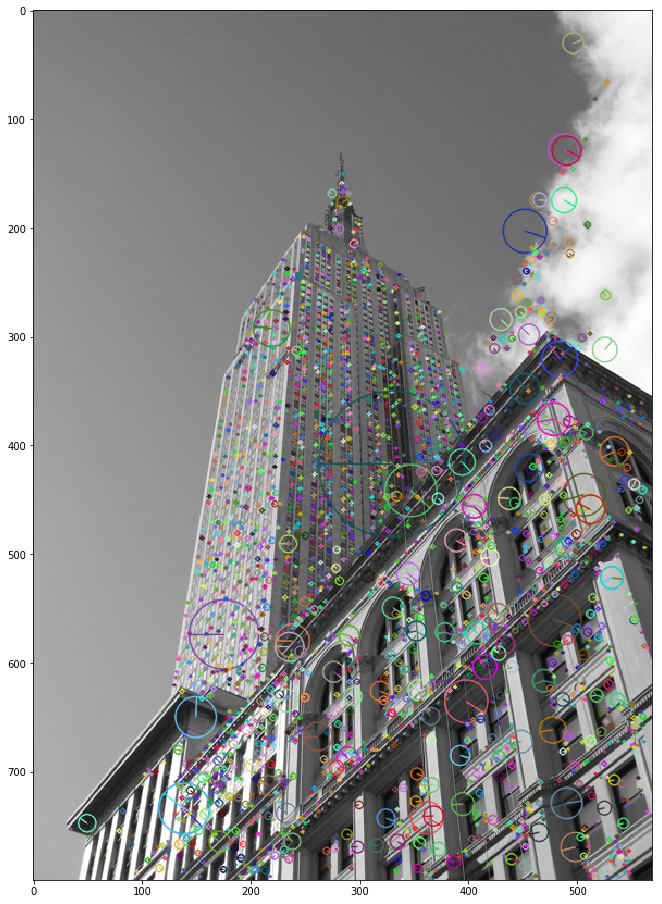

In [40]:
img = cv2.imread('../data/empire.jpg')
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
sift = cv2.xfeatures2d.SIFT_create()
kp,des = sift.detectAndCompute(gray,None)
# print(len(kp),des.shape,des[9])
img=cv2.drawKeypoints(gray,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(16,16))
plt.imshow(img[...,::-1])
plt.show()

In [41]:
im1=np.array(Image.open('../data/crans_1_small.jpg').convert('L'))
im2=np.array(Image.open('../data/crans_2_small.jpg').convert('L'))

In [47]:
sift = cv2.xfeatures2d.SIFT_create()
p1,des1 = sift.detectAndCompute(im1,None)
p2,des2 = sift.detectAndCompute(im2,None)

In [49]:
p1=[_.pt for _ in p1]
p2=[_.pt for _ in p2]

In [50]:
p1=np.array(p1)
p2=np.array(p2)

In [54]:
match_points=sift_match(p1,p2,des1,des2)

In [62]:
h,w=im1.shape
comb_img=np.zeros((h*2,w*2))
comb_img[:h,:w]=im1
comb_img[h:,w:]=im2

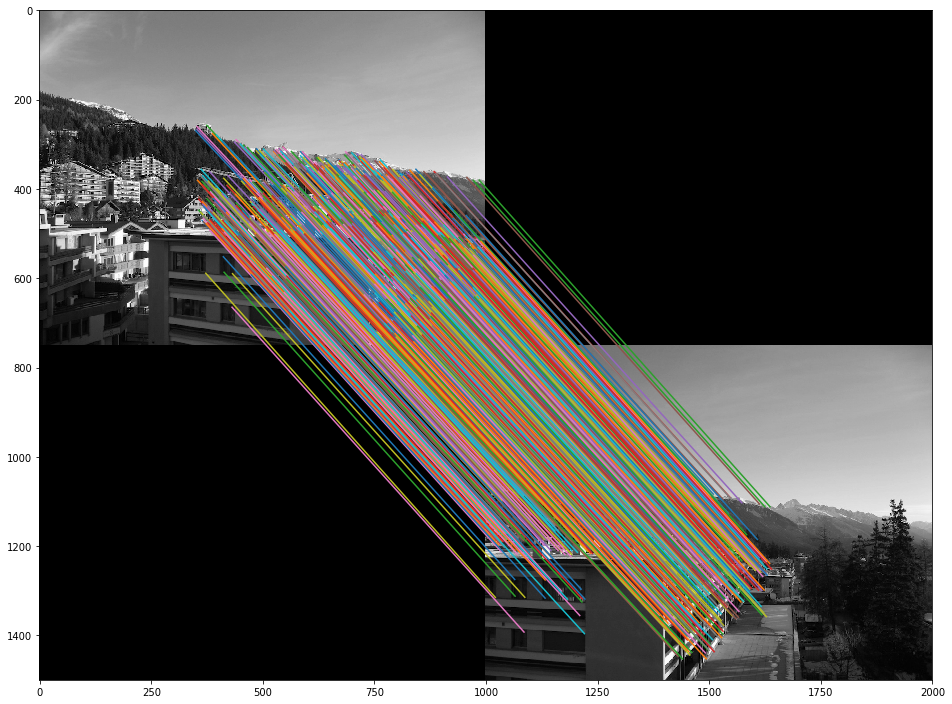

In [66]:
# plot the matching points...
plt.figure(figsize=(16,16))
h,w=im1.shape
plt.imshow(comb_img,cmap=plt.cm.gray)
start=0
window=10000
for x1,y1,x2,y2 in match_points[start:start+window]:
    plt.plot([x1,x2+w],[y1,y2+h])
plt.show()

In [68]:
im1=np.array(Image.open('../data/climbing_1_small.jpg').convert('L'))
im2=np.array(Image.open('../data/climbing_2_small.jpg').convert('L'))

In [69]:
h,w=im1.shape

In [106]:
p1,des1 = sift.detectAndCompute(im1,None)
p2,des2 = sift.detectAndCompute(im2,None)

p1=[_.pt for _ in p1]
p2=[_.pt for _ in p2]

p1=np.array(p1)
p2=np.array(p2)

idx1=sift_match_once(des1,des2)
idx_mask=idx1>=0
match_points1=np.concatenate([p1[idx_mask],p2[idx1[idx_mask]]] ,axis=1)
match_points2=sift_match(p1,p2,des1,des2)

In [103]:
# comb_img=np.zeros((h*2,w*2))
# comb_img[:h,:w]=im1
# comb_img[h:,w:]=im2
comb_img=np.tile(np.concatenate([im1,im2],axis=1),(2,1))

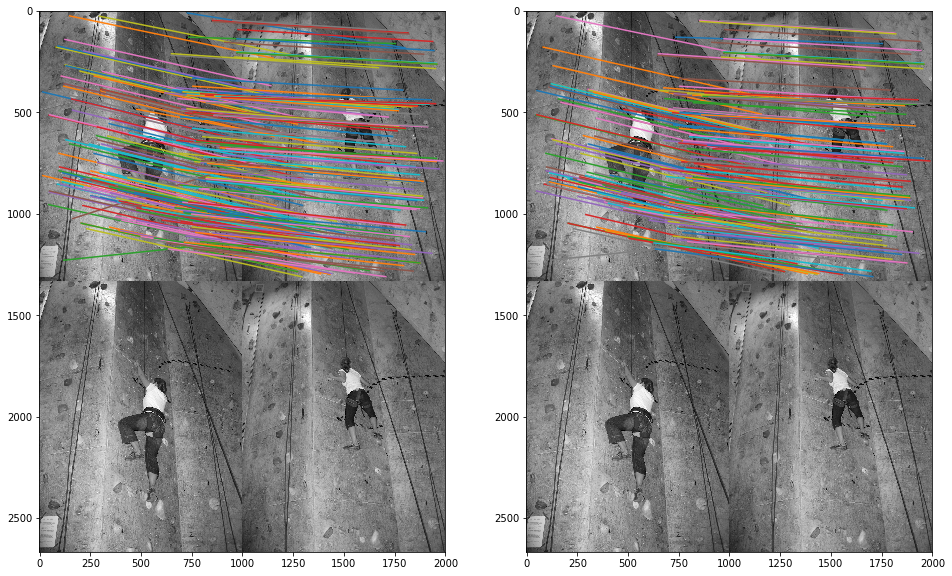

In [107]:
plt.figure(figsize=(16,16))
for i,mp in enumerate([match_points1,match_points2]):
    plt.subplot(1,2,1+i)
    plt.imshow(comb_img,cmap=plt.cm.gray)
    for x1,y1,x2,y2 in mp:
        plt.plot([x1,x2+w],[y1,y2])
plt.show()

## 2.3 匹配地理标记图像

## 2.3.1 Panoramio地理标记图像

In [111]:
import glob

im_paths=glob.glob('../data/panoimages/*.jpg')
im_paths+=glob.glob('../data/panoimages/*.png')

In [112]:
imgs=[np.array(Image.open(_).convert('L')) for _ in im_paths]

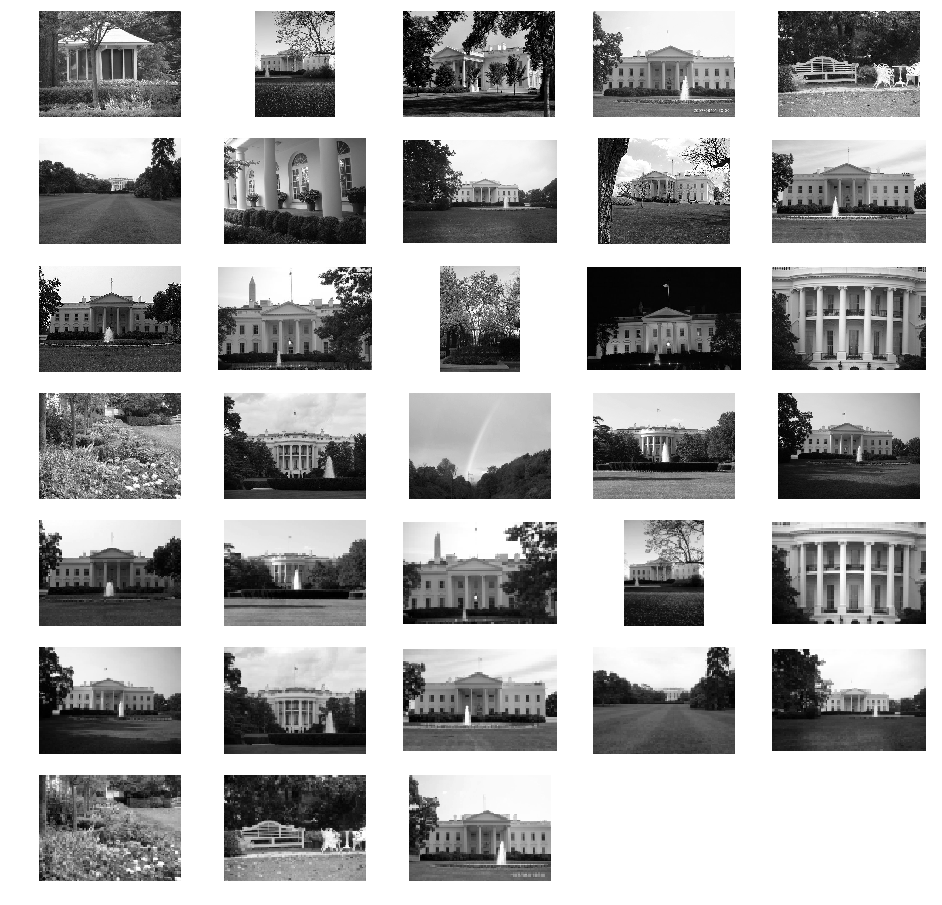

In [122]:
plt.figure(figsize=(16,16))
for i,im in enumerate(imgs):
    plt.subplot(7,5,1+i)
    plt.imshow(im,cmap=plt.cm.gray)
    plt.axis('equal')
    plt.axis('off')
plt.show()

## 2.3.2 使用局部描述子匹配

In [129]:
# extract the SIFT features
sift_feats=[sift.detectAndCompute(_,None) for _ in imgs]

In [130]:
sift_points,sift_feats=[_ for _,__ in sift_feats],[__ for _,__ in sift_feats]

In [131]:
n=len(imgs)

In [133]:
match_scores=np.zeros((n,n))
for i in range(n):
    for j in range(i,n):
        desp1=sift_feats[i]
        desp2=sift_feats[j]
        idx1=sift_match_once(desp1,desp2) # [n1]
        idx2=sift_match_once(desp2,desp1) # [n2]

        map_idx1=np.full((len(idx2)+1),-2)
        map_idx1[idx1]=range(len(idx1))
        map_idx1=map_idx1[:len(map_idx1)-1]
        same_mask=map_idx1==idx2
        match_scores[i,j]=same_mask.sum()
        match_scores[j,i]=match_scores[i,j]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app


In [155]:
for i in range(n):
    for j in range(n):
        if j==n-1:
            print(match_scores[i,j],end='')
        else:
            print(match_scores[i,j],end=' ')
    print()

1359.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0
0.0 1033.0 0.0 2.0 0.0 0.0 0.0 4.0 0.0 0.0 1.0 1.0 0.0 2.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 1.0 0.0 34.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0
0.0 0.0 1209.0 0.0 0.0 0.0 0.0 1.0 0.0 1.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0
0.0 2.0 0.0 640.0 0.0 0.0 1.0 6.0 1.0 15.0 4.0 5.0 0.0 1.0 1.0 0.0 1.0 0.0 0.0 11.0 3.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 1.0 1.0 0.0 0.0 26.0
0.0 0.0 0.0 0.0 1128.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 12.0 2.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 19.0 0.0
0.0 0.0 0.0 0.0 0.0 367.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 15.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.0 0.0 8.0 1.0 0.0 0.0 0.0
0.0 0.0 0.0 1.0 0.0 0.0 645.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0
0.0 4.0 1.0 6.0 0.0 0.0 0.0 364.0 2.0 0.0 2.0 3.0 2

In [156]:
import pydot

In [165]:
import os

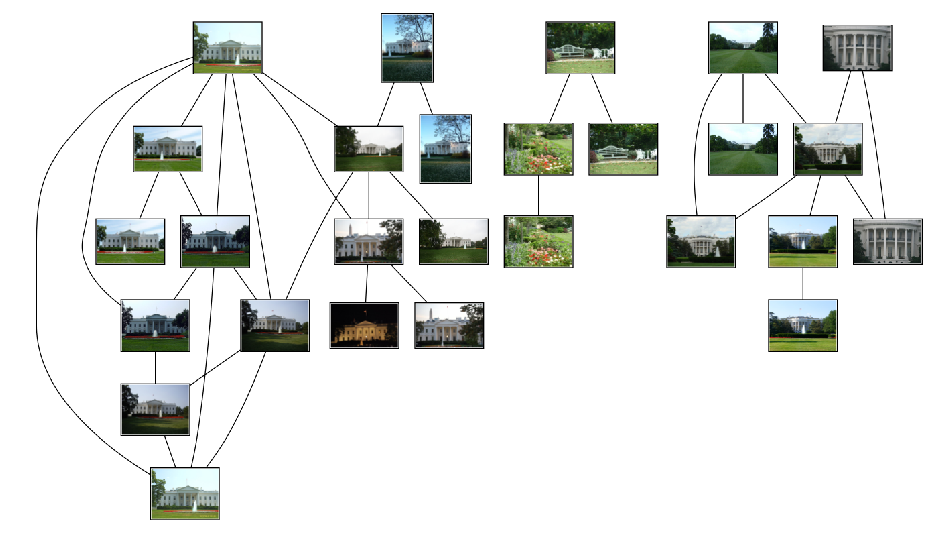

In [183]:
prefix='./temp/'
g=pydot.Dot(graph_type='graph' )
thresh=2
for i in range(len(im_paths)):
    for j in range(i+1,len(im_paths)):
        if match_scores[i,j]>2:
            im1=Image.open(im_paths[i])
            im1.thumbnail((100,100))
            file_name=prefix+str(i) +'.png'
            file_name=os.path.abspath(file_name)
            im1.save(file_name)
            g.add_node(pydot.Node(str(i),fontcolor='transparent',shape='rectangle',image=file_name))
            
            im2=Image.open(im_paths[j])
            im2.thumbnail((100,100))
            file_name=prefix+str(j) + '.png'
            file_name=os.path.abspath(file_name)

            im2.save(file_name)
            
            g.add_node(pydot.Node(str(j),fontcolor='transparent',shape='rectangle',image=file_name))
            g.add_edge(pydot.Edge(str(i),str(j)) )
g.write_png('res.png')
plt.figure(figsize=(16,16))
plt.imshow(plt.imread('res.png'))
plt.axis('off')
plt.show()

## 练习

诶，就这样老子不想写了- -

### 1. 为了让匹配具有更强的稳健性， 修改用于匹配Harris角点的函数，使其输入参数中包含认为两点存在对应关系允许的最大像素距离。

In [184]:
im1=np.array(Image.open('../data/crans_1_small.jpg').convert('L'))
im2=np.array(Image.open('../data/crans_2_small.jpg').convert('L'))

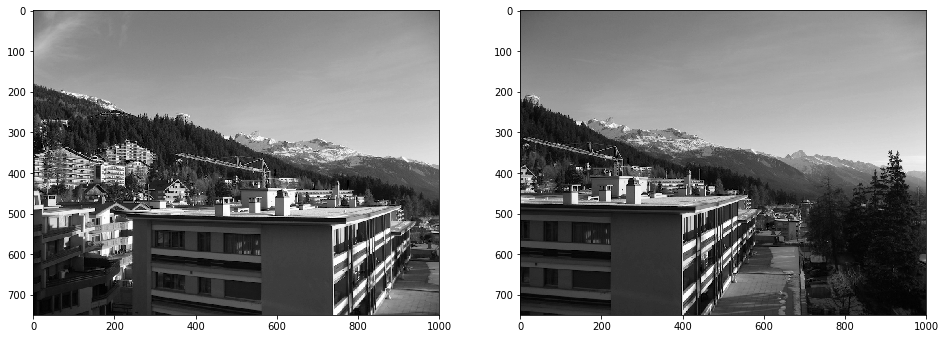

In [185]:
plt.figure(figsize=(16,16))
plt.subplot(1,2,1)
plt.imshow(im1,cmap=plt.cm.gray)
plt.subplot(1,2,2)
plt.imshow(im2,cmap=plt.cm.gray)
plt.show()

In [197]:
match_point=harris_match(im1,im2,max_dis=100)

In [198]:
match_point.shape

(4, 4)

In [199]:
comb_img=np.concatenate([im1,im2],axis=1) # [h,w+2]

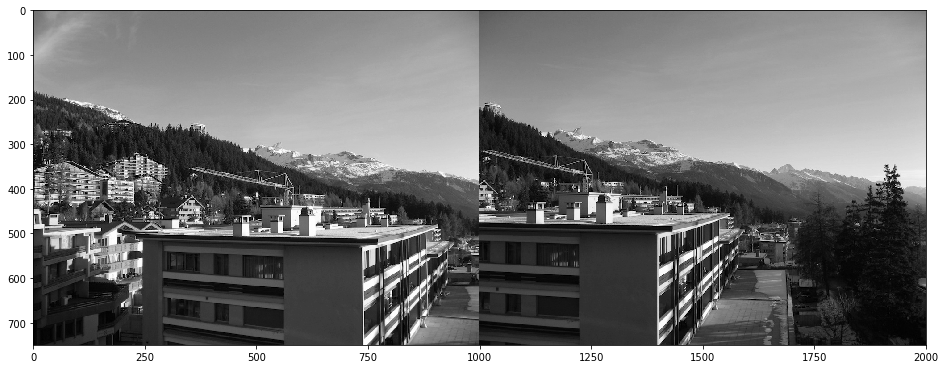

In [200]:
plt.figure(figsize=(16,16))
plt.imshow(comb_img,cmap=plt.cm.gray)
plt.show()

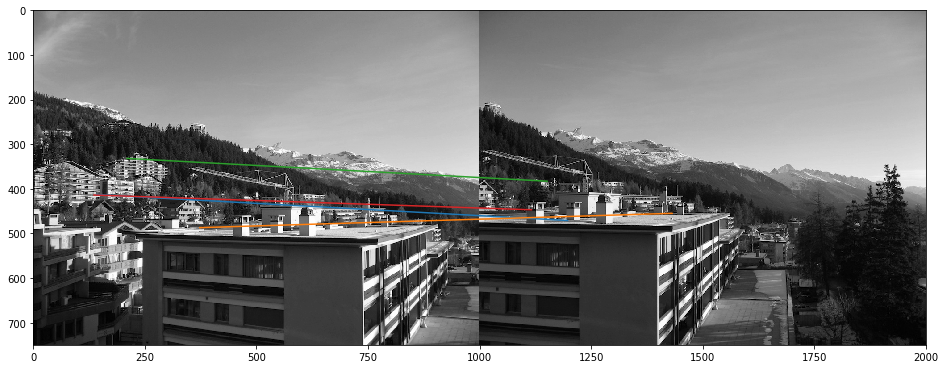

In [201]:
# plot the matching points...
plt.figure(figsize=(16,16))
h,w=im1.shape
plt.imshow(comb_img,cmap=plt.cm.gray)
start=0
window=1000
for x1,y1,x2,y2 in match_point[start:start+window]:
    plt.plot([x1,x2+w],[y1,y2])
plt.show()

### 2. 对一幅图像不断地应用模糊操作（或者ROF去噪）， 使得模糊效果越来越强，然后提取Harris角点， 会出现什么问题？

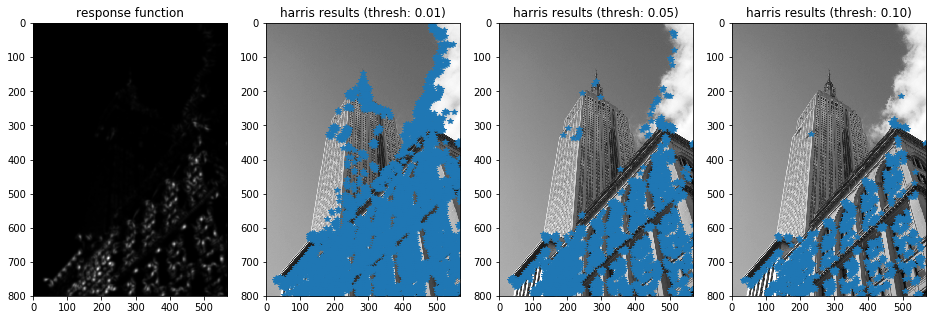

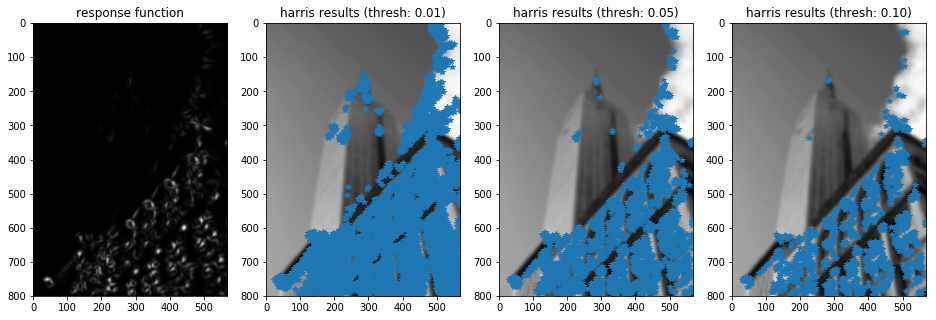

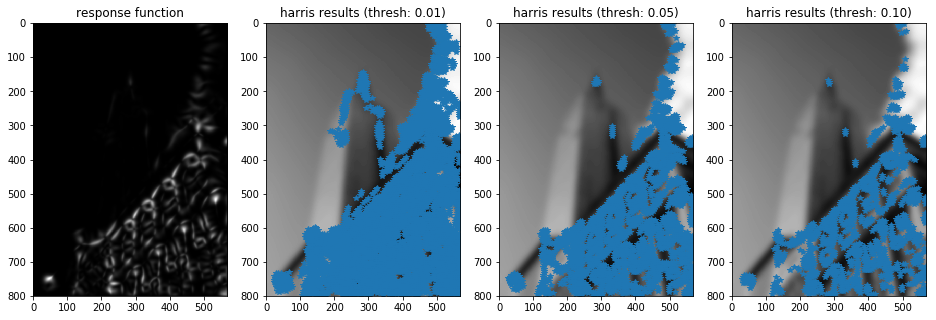

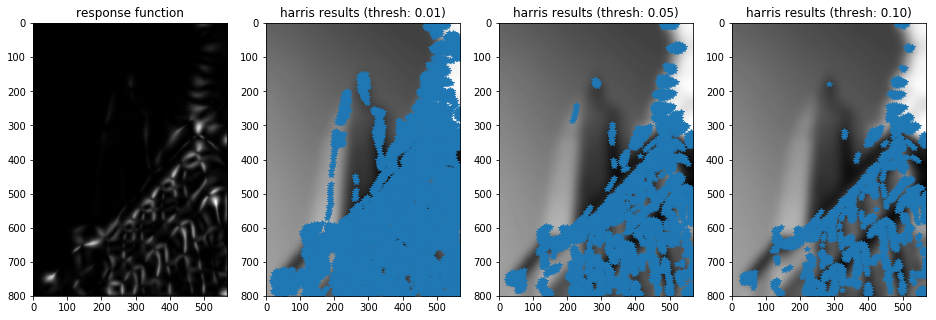

In [203]:
for i in range(4):
    im=np.array(Image.open('../data/empire.jpg').convert('L'))
    if i>0:
        im=filters.gaussian_filter(im,i*5)
    hrs_mat=get_harris_response(im) 
    corners1=get_harris_corner(hrs_mat,6,.01)
    corners2=get_harris_corner(hrs_mat,6,.05)
    corners3=get_harris_corner(hrs_mat,6,.1)
    # show
    plot_list=[.01,.05,.1]
    plt.figure(figsize=(16,16))
    plot_col=1+len(plot_list)
    plt.subplot(1,plot_col,1)
    plt.title('response function')
    plt.imshow(hrs_mat,cmap=plt.cm.gray)

    for i,(v,corners) in enumerate(zip(plot_list,[corners1,corners2,corners3]) ):
        plt.subplot(1,plot_col,2+i)
        plt.title('harris results (thresh: %.2f)'%(v))
        plt.imshow(im,cmap=plt.cm.gray)
        plt.plot(corners[:,0],corners[:,1],'*')
    plt.show()

### 3. 另一种Harris角点检测器是快速角点检测器。有很多快速角点检测器的实现方法，包括纯Python语言实现的版本，可以在 [fast.html](http://www.edwardrosten.com/work/ )下载。尝试使用该检测器，使用敏感性的阈值，然后将结果和 Harris角点检测器检测出的角点比较。

In [2]:
import fast12

In [3]:
im=np.array(Image.open('../data/empire.jpg').convert('L'))

In [12]:
# hrs_mat=get_harris_response(im) 
# corners1,scores1=fast12.detect(im,100)
corners1,scores1=fast12.detect(im,40)
corners2,scores2=fast12.detect(im,80)
corners3,scores3=fast12.detect(im,120)

In [10]:
corners1=np.array(corners1)
corners2=np.array(corners2)
corners3=np.array(corners3)

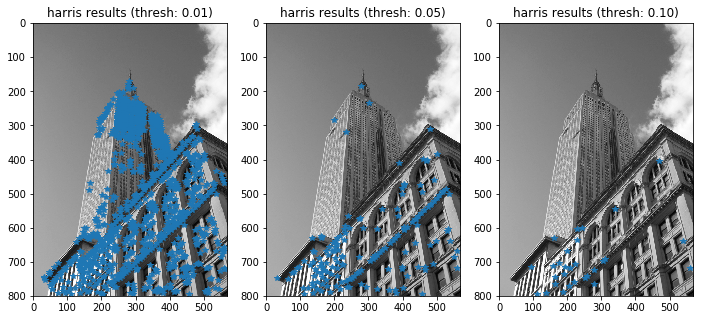

In [11]:
# show
plot_list=[.01,.05,.1]
plt.figure(figsize=(16,16))
plot_col=1+len(plot_list)
# plt.subplot(1,plot_col,1)
# plt.title('response function')
# plt.imshow(hrs_mat,cmap=plt.cm.gray)

for i,(v,corners) in enumerate(zip(plot_list,[corners1,corners2,corners3]) ):
    plt.subplot(1,plot_col,1+i)
    plt.title('harris results (thresh: %.2f)'%(v))
    plt.imshow(im,cmap=plt.cm.gray)
    plt.plot(corners[:,0],corners[:,1],'*')
plt.show()

### 4. 以不同分辨率创建一幅图像的副本（例如，可以尝试多次将图像的尺寸减半）。 对每幅图像提取SIFT特征。绘制以及匹配特征，来发现尺度的独立性是如何以及何时失效的。

In [5]:
import cv2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app


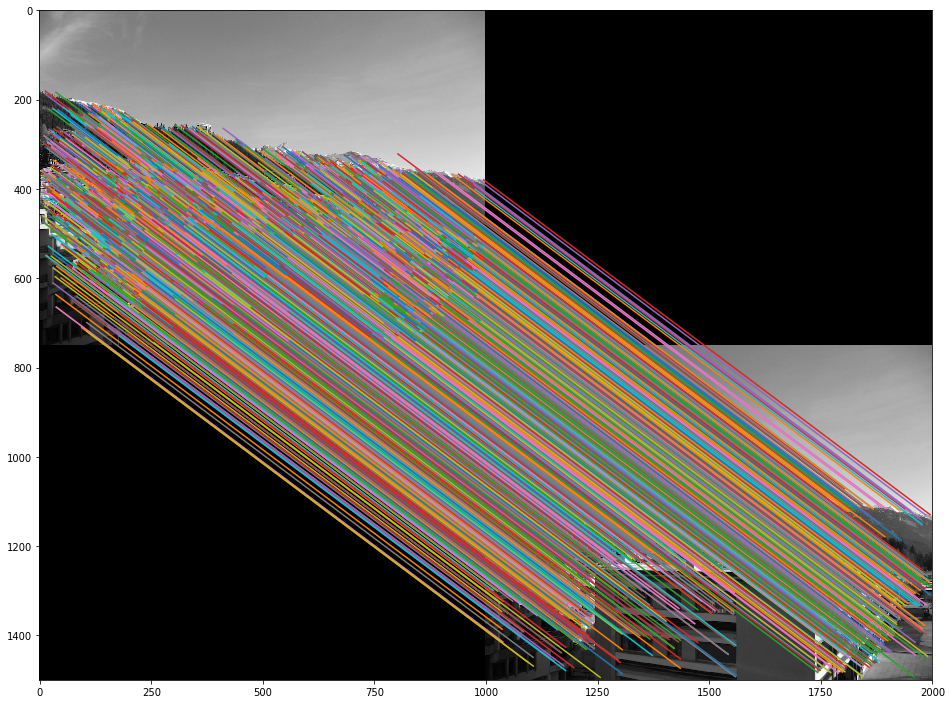

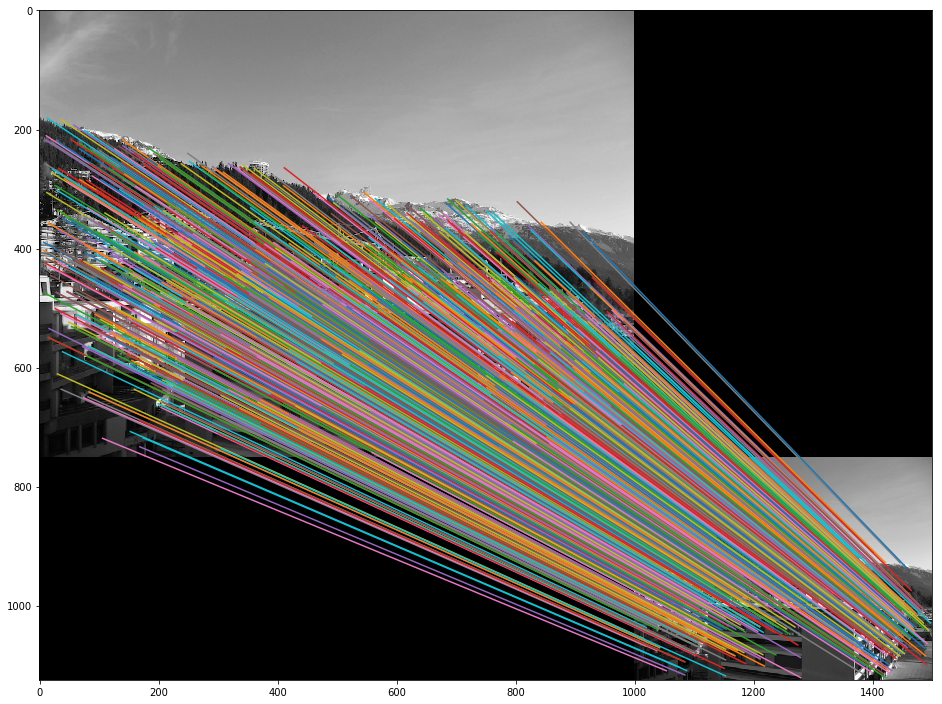

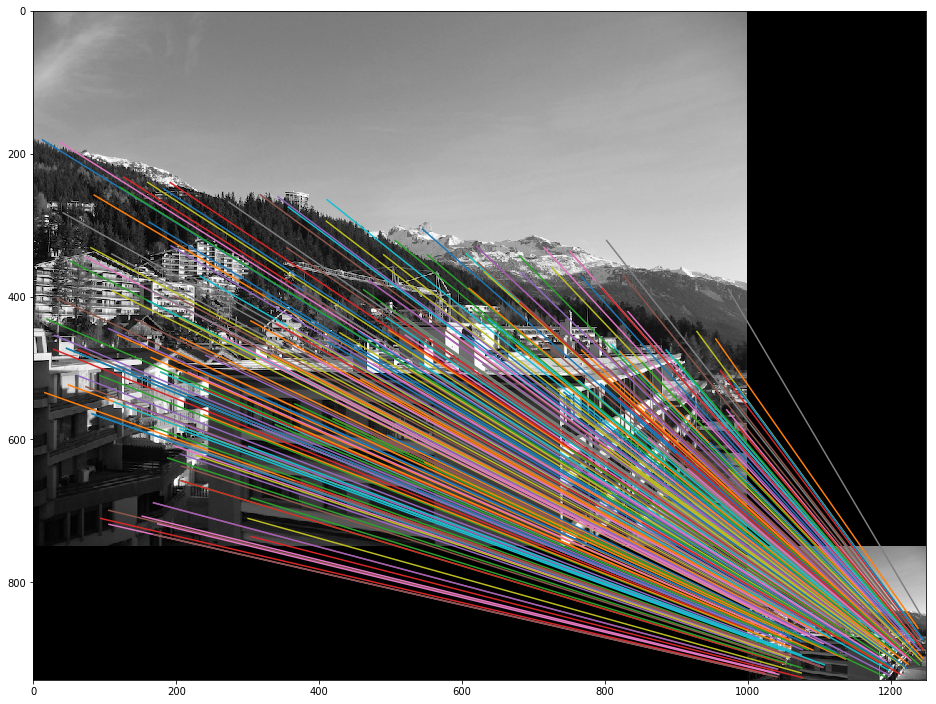

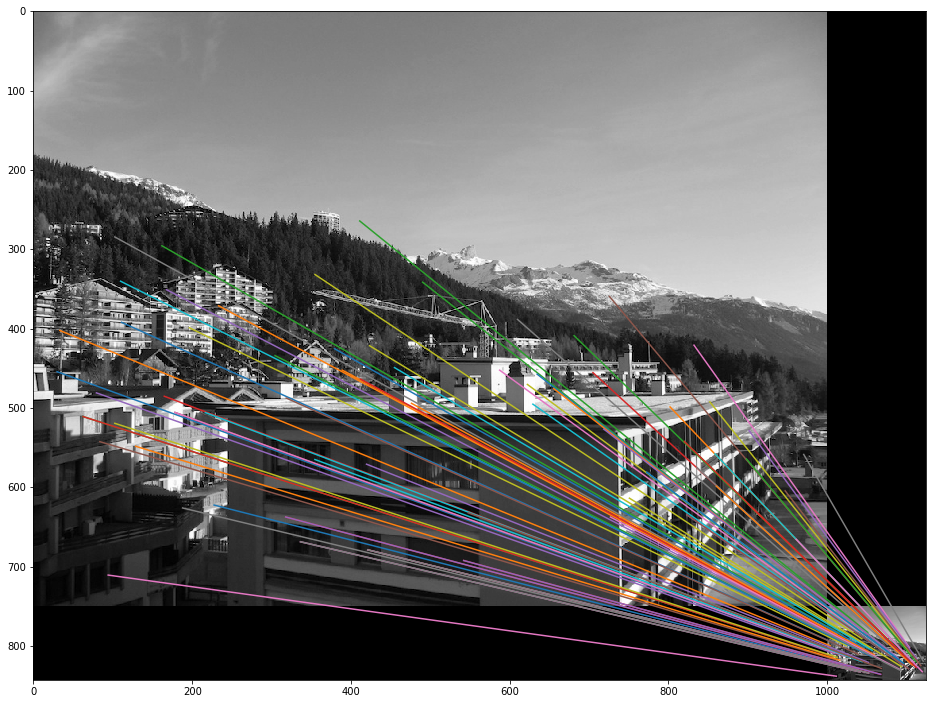

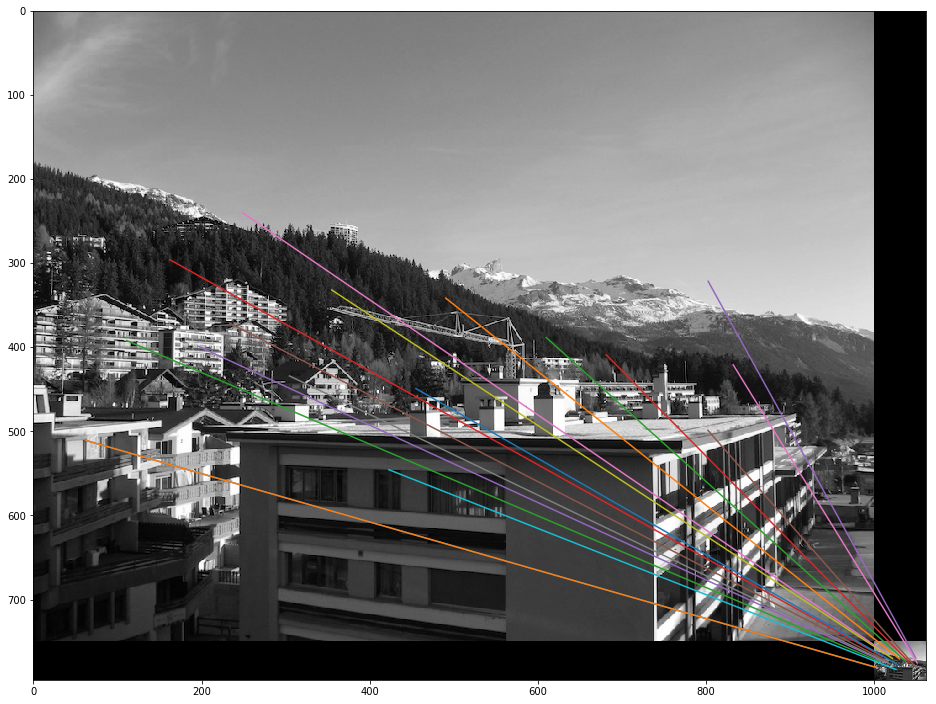

In [12]:
for i in range(5):
    im1=np.array(Image.open('../data/crans_1_small.jpg').convert('L'))
    h,w=im1.shape
    im2=np.array(Image.open('../data/crans_1_small.jpg').resize((w//(2**i), h//(2**i) ),Image.ANTIALIAS).convert('L'))

    sift = cv2.xfeatures2d.SIFT_create()
    p1,des1 = sift.detectAndCompute(im1,None)
    p2,des2 = sift.detectAndCompute(im2,None)
    p1=[_.pt for _ in p1]
    p2=[_.pt for _ in p2]
    p1=np.array(p1)
    p2=np.array(p2)
    match_points=sift_match(p1,p2,des1,des2)
    comb_img=np.zeros((h+im2.shape[0],w+im2.shape[1] ))
    comb_img[:h,:w]=im1
    comb_img[h:,w:]=im2
    
    # plot the matching points...
    plt.figure(figsize=(16,16))
    h,w=im1.shape
    plt.imshow(comb_img,cmap=plt.cm.gray)
    start=0
    window=10000
    for x1,y1,x2,y2 in match_points[start:start+window]:
        plt.plot([x1,x2+w],[y1,y2+h])
    plt.show()

### 5. VLFeat命令行工具同样实现了最大稳定极值区域（[MSER](http://en.wikipedia.org/wiki/Maximally_stable_extremal_regions) ）算法。该算法是个能够找到角点一侧区域的区域检测器。创建一个用于提取MSER区域的函数，然后使用-read-frames选项将它们传递给SIFT 特征描述子部分，最后写出一个用于绘制该区域边界的函数。

In [18]:
import os

In [38]:
prefix='$HOME/workspace/software/vlfeat/'
cmmd=prefix+'bin/glnxa64/mser'+' --min-area=0.0001 --max-area=0.001 --frames=tmp.frame %s'

In [70]:
gim=Image.open('../data/climbing_1_small.jpg').convert('L')
gim=np.array(gim)
Image.fromarray(gim).save('temp.pgm')
# os.system('convert ../data/climbing_1_small.jpg -flatten temp.pgm')

In [71]:
os.system(cmmd%('temp.pgm') )

0

In [72]:
frames=np.loadtxt('./tmp.frame')

In [73]:
x,y,s11,s12,s22=frames[:,0],frames[:,1],frames[:,2],frames[:,3],frames[:,4]

In [74]:
conv=np.array([[s11,s12],[s12,s22]]).transpose(2,0,1)

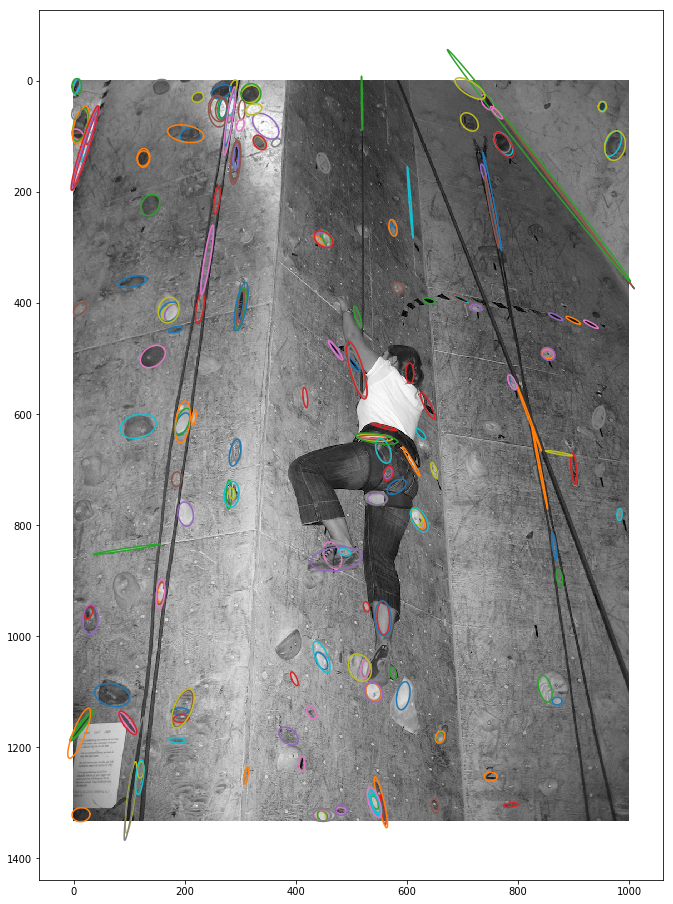

In [103]:
plt.figure(figsize=(16,16))
plt.imshow(gim,cmap=plt.cm.gray)
# plot the eclipse approximation Maximum Stable Extremal Region
for x,y,s11,s12,s22 in frames:
    conv=np.array([[s11,s12],[s12,s22]])
    var,vec=np.linalg.eig(conv)
    x1=vec[0][0]
    y1=vec[1][0]
    theta=np.arctan2(y1,x1)
    w1,h1=np.sqrt(var)*2
    pt=np.arange(0,2*np.pi,.01)
    px=w1*np.cos(pt)
    py=h1*np.sin(pt)
    
    # rotation matrix
    pxnew=np.cos(theta)*px - np.sin(theta)*py + x
    pynew=np.sin(theta)*px + np.cos(theta)*py + y

    plt.plot(pxnew,pynew)

plt.show()

### 6. 基于对应关系，写出在图像对间匹配特征的函数，以实现估计尺度差异以及场景的平面旋转。

In [183]:
def sift_match(p1,p2,desp1,desp2,s1,s2,a1,a2):
    idx1=sift_match_once(desp1,desp2) # [n1]
    idx2=sift_match_once(desp2,desp1) # [n2]
    
    map_idx1=np.full((len(idx2)+1),-2)
    map_idx1[idx1]=range(len(idx1))
    map_idx1=map_idx1[:len(map_idx1)-1]
    same_mask=map_idx1==idx2
    
#     print(same_mask)
    idx1=idx2[same_mask]
    idx2=same_mask
    
    re_p2=p2[idx2] # [n',2]
    re_p1=p1[idx1]
    
    re_s2=s2[idx2] # [n',1]
    re_s1=s1[idx1] # [n',1]
    
    re_a2=a2[idx2]
    re_a1=a1[idx1]
    
    return np.concatenate([re_p1,re_p2],axis=1),\
        np.concatenate([re_s1[:,None],re_s2[:,None]],axis=1),\
        np.concatenate([re_a1[:,None],re_a2[:,None]],axis=1)

In [129]:
im1=np.array(Image.open('../data/climbing_1_small.jpg').convert('L'))
im2=np.array(Image.open('../data/climbing_2_small.jpg').convert('L'))

In [128]:
h,w=im1.shape

In [132]:
sift = cv2.xfeatures2d.SIFT_create()
p1,des1 = sift.detectAndCompute(im1,None)
p2,des2 = sift.detectAndCompute(im2,None)

s1=[_.size for _ in p1]
s2=[_.size for _ in p2]

a1=[_.angle for _ in p1]
a2=[_.angle for _ in p2]

p1=[_.pt for _ in p1]
p2=[_.pt for _ in p2]

p1=np.array(p1)
p2=np.array(p2)

a1=np.array(a1)
a2=np.array(a2)

s1=np.array(s1)
s2=np.array(s2)

In [135]:
mp,ms,ma=sift_match(p1,p2,des1,des2,s1,s2,a1,a2)

In [140]:
# comb_img=np.zeros((h*2,w*2))
# comb_img[:h,:w]=im1
# comb_img[h:,w:]=im2
comb_img=np.tile(np.concatenate([im1,im2],axis=1),(2,1))

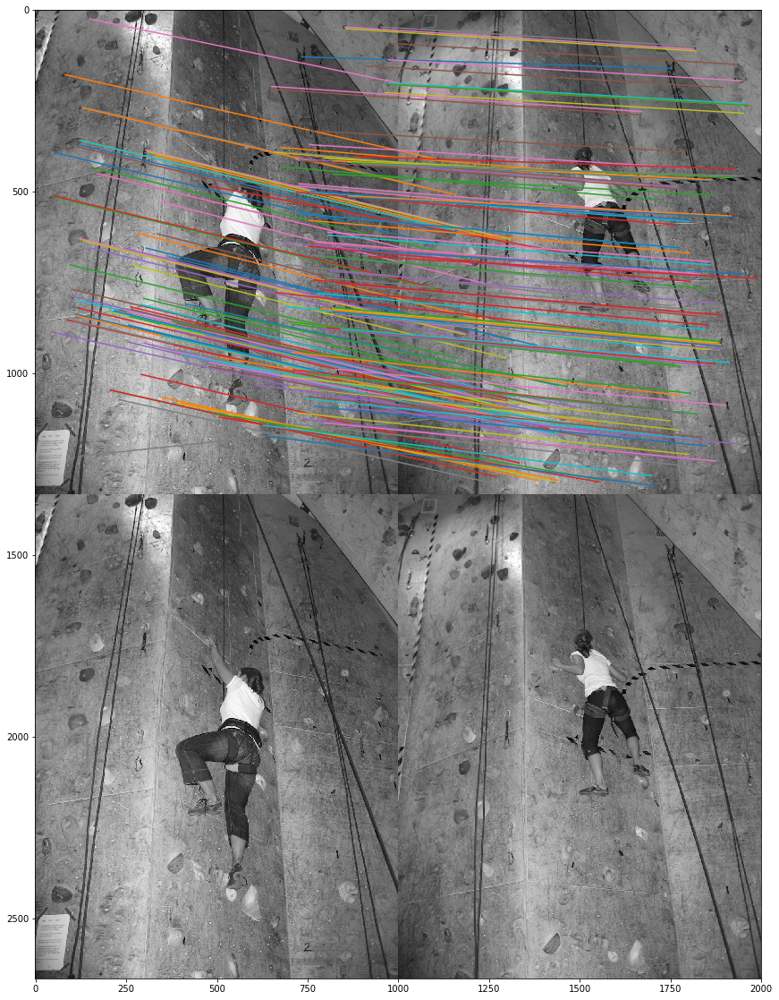

In [169]:
plt.figure(figsize=(32,32))
plt.subplot(1,2,1)
plt.imshow(comb_img,cmap=plt.cm.gray)
for x1,y1,x2,y2 in mp:
    plt.plot([x1,x2+w],[y1,y2])
plt.show()

#### wrong

In [166]:
scale=((ms[:,1]/ms[:,0])).mean()

In [162]:
angle=(ma[:,1]-ma[:,0]).mean()

In [182]:
print("scale: ",scale,'angle: ',angle)

scale:  1.0039063144709395 angle:  1.803464640741763


#### resonable

In [200]:
p1mean=mp[:,:2].mean(axis=0) # [2]
p2mean=mp[:,2:].mean(axis=0) # [2]

In [195]:
r1=np.sqrt(((mp[:,:2]-p1mean[None])**2).sum(axis=1))
r2=np.sqrt(((mp[:,2:]-p2mean[None])**2).sum(axis=1))
scale=(r2/r1).mean()

In [210]:
angle=np.arctan2(mp[:,3]-p2mean[1],mp[:,2]-p2mean[0])-np.arctan2(mp[:,1]-p1mean[1],mp[:,0]-p1mean[0])

In [211]:
angle=angle.mean()*180/np.pi

In [212]:
print("scale: ", scale, "angle: ",angle)

scale:  1.0799823382221376 angle:  5.954105470927147


### 7. 任意选取一个位置，然后下载该位置的图像，像白宫例子一样将它们匹配起来。 你能发现用于连接这些图像的更好方式吗？你是如何利用图来选取用于地理位置具有代表性的图像的？

In [156]:
# emmm, nothing...